In [2]:
# https://astroquery.readthedocs.io/en/latest/vizier/vizier.html
import matplotlib.pyplot as plt
import numpy as np

from astroquery.vizier import Vizier
import astropy.units as u
import astropy.coordinates as coord
from astropy.table import Table

import lightkurve as lk

import sys
import os
import time
import re
import json

import requests
from urllib.parse import quote as urlencode


vizier = Vizier()

# Visualizing dataset distribution

In [83]:
gaia_dr1_cepheids = ["I/337/cepheid"]
gaia_dr2_cepheids = ["I/345/cepheid"]
gaia_dr3_cepheids = ["I/358/vcep", "I/358/vceph"]

# https://tapvizier.u-strasbg.fr/adql/?gaia
# https://tapvizier.u-strasbg.fr/adql/?tess
# only GAIA has cepheid labels, hence we need to crossmatch

tess_catalogs = ["IV/38", "IV/39", "J/ApJS/241/12"]

# for catalog in tess_catalogs:
#     print(f"Catalog: {catalog}")
#     metadata = Vizier(catalog=catalog).get_catalog_metadata()
#     for col in metadata.colnames:
#         print(f"{col}: {metadata[col][0]}")
#     print()
#     for col in catalog[0].colnames:
#         print(f"{col}: {catalog[0][col].description}")
#     print()

In [6]:
Vizier(catalog='I/358').get_catalog_metadata()

title,authors,abstract,origin_article,webpage,created,updated,waveband,doi
object,object,object,object,object,object,object,object,object
Gaia DR3 Part 4. Variability,Gaia collaboration,"Gaia Data Release 3 (Gaia DR3) will be released on 13 June 2022. The Gaia DR3 catalogue builds upon the Early Data Release 3 (released on 3 December 2020) and combines, for the same stretch of time and the same set of observations, these already-published data products with numerous new data products such as extended objects and non-single stars.",2023A&A...674A...1G,https://cdsarc.cds.unistra.fr/viz-bin/cat/I/358,2022-06-10T10:36:28,2025-04-09T00:00:00,optical,doi:10.26093/cds/vizier.1358


In [7]:
vizier.ROW_LIMIT = -1
cepheids = vizier.get_catalogs('I/358/vcep')

In [68]:
[print(x) for x in cepheids[0].colnames]
print(cepheids[0])

Harm
Source
SolID
PF
P1O
Gmagavg
BPmagavg
RPmagavg
RVavg
[M/H]
R21G
R31G
phi21G
phi31G
FundFreq1
FundFreq2
P2O
Class
SubClass
ModeClass
MulModeClass
RA_ICRS
DE_ICRS
Harm        Source             SolID        ...     RA_ICRS         DE_ICRS    
                                            ...       deg             deg      
---- ------------------- ------------------ ... --------------- ---------------
Harm 1051896903074455936 375316653866487564 ... 152.42395747221  61.65869216095
Harm 1113929871645836672 375316653866487564 ...  90.52184792417  72.85143255057
Harm 1171164605830596864 375316653866487564 ... 219.55570410593   5.83980877684
Harm 1208200864738741376 375316653866487564 ... 229.11867976811  16.44430064210
Harm 1248397910338129664 375316653866487564 ... 206.21860421223  19.47084356320
Harm 1303409157136772096 375316653866487564 ... 245.85353012484  25.83445812864
Harm 1306279466601099904 375316653866487564 ... 253.28602527426  25.97636711752
Harm 1322273271975938304 3753166538

| Column Header | Description |
|---------------|-------------|
| `Harm` | Whether harmonic analysis was used (e.g., periodic signal detection). |
| `Source` | Unique Gaia DR3 source ID. |
| `SolID` | ID of the solution/model applied to the source. |
| `PF` | Pulsation frequency (Hz or 1/day). |
| `P1O` | Period of the first overtone mode. |
| `Gmagavg` | Mean G-band magnitude. |
| `BPmagavg` | Mean GBP (blue photometer) magnitude. |
| `RPmagavg` | Mean GRP (red photometer) magnitude. |
| `RVavg` | Mean radial velocity (km/s), derived from RVS spectra. |
| `[M/H]` | Metallicity estimate: log of heavy element abundance relative to H. |
| `R21G` | Amplitude ratio: 2nd to 1st harmonic in G-band light curve. |
| `R31G` | Amplitude ratio: 3rd to 1st harmonic in G-band light curve. |
| `phi21G` | Phase difference between 2nd and 1st harmonic in G-band. |
| `phi31G` | Phase difference between 3rd and 1st harmonic in G-band. |
| `FundFreq1` | Fundamental mode frequency. |
| `FundFreq2` | Second fundamental mode frequency (if multi-periodic). |
| `P2O` | Period of the second overtone mode. |
| `Class` | Main variability class (e.g., RR Lyrae, Cepheid, etc.). |
| `SubClass` | More specific classification (e.g., RRab, RRc, etc.). |
| `ModeClass` | Dominant pulsation mode (e.g., fundamental or overtone). |
| `MulModeClass` | Indicates multi-mode pulsation behavior. |
| `RA_ICRS` | Right ascension in ICRS (degrees). |
| `DE_ICRS` | Declination in ICRS (degrees). |


Can use RVavg to get speed for Hubble plot

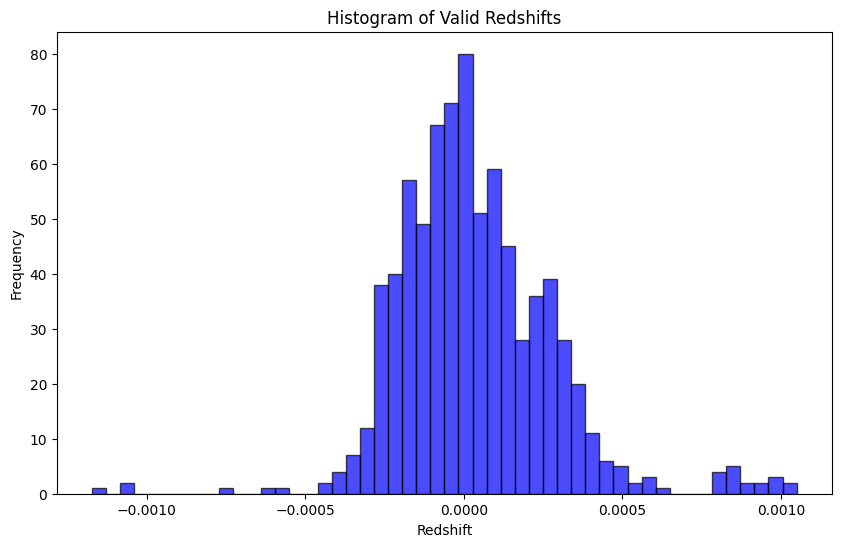

In [78]:
# Speed of light in km/s
c = 299792.458

# Extract RVavg column
rv_avg = cepheids[0]['RVavg']

# Calculate redshift using the relativistic formula
redshifts = np.sqrt((1 + rv_avg / c) / (1 - rv_avg / c)) - 1

# Display the redshifts
# print(redshifts)

# Remove None values from redshifts
valid_redshifts = redshifts[~redshifts.mask]

# Plot the histogram of redshifts
plt.figure(figsize=(10, 6))
plt.hist(valid_redshifts, bins=50, alpha=0.7, color='blue', edgecolor='black')
plt.xlabel('Redshift')
plt.ylabel('Frequency')
plt.title('Histogram of Valid Redshifts')
plt.show()

In [11]:
# Calculate mean and standard deviation
mean_redshift = np.mean(valid_redshifts)
std_dev_redshift = np.std(valid_redshifts)

# Print the results
print(f"Mean Redshift: {mean_redshift}")
print(f"Standard Deviation of Redshift: {std_dev_redshift}")

Mean Redshift: 3.396838679477597e-05
Standard Deviation of Redshift: 0.0002465098001976944


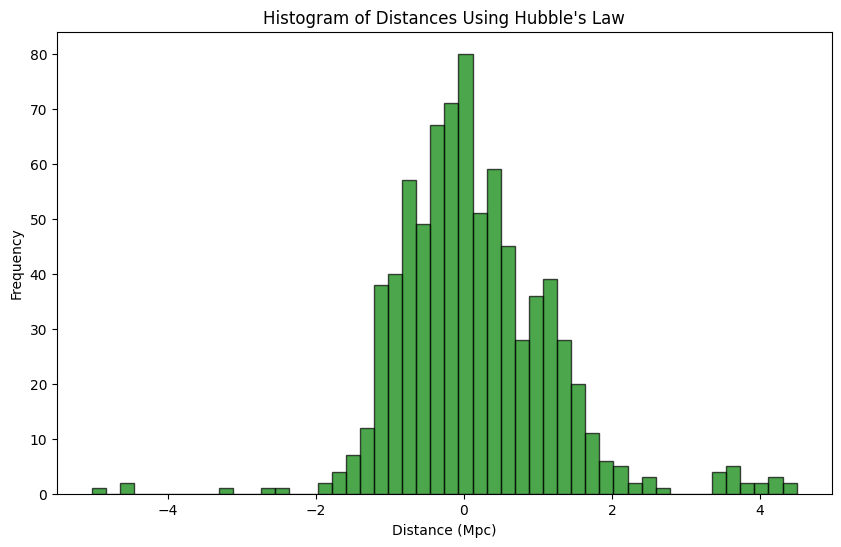

In [12]:
# Define the Hubble constant (in km/s/Mpc)
H0 = 70  # You can adjust this value as needed

# Calculate distances using Hubble's law
distances = valid_redshifts * c / H0  # Distance in Mpc

# Plot the histogram of distances
plt.figure(figsize=(10, 6))
plt.hist(distances, bins=50, alpha=0.7, color='green', edgecolor='black')
plt.xlabel('Distance (Mpc)')
plt.ylabel('Frequency')
plt.title('Histogram of Distances Using Hubble\'s Law')
plt.show()

4.493488857142858


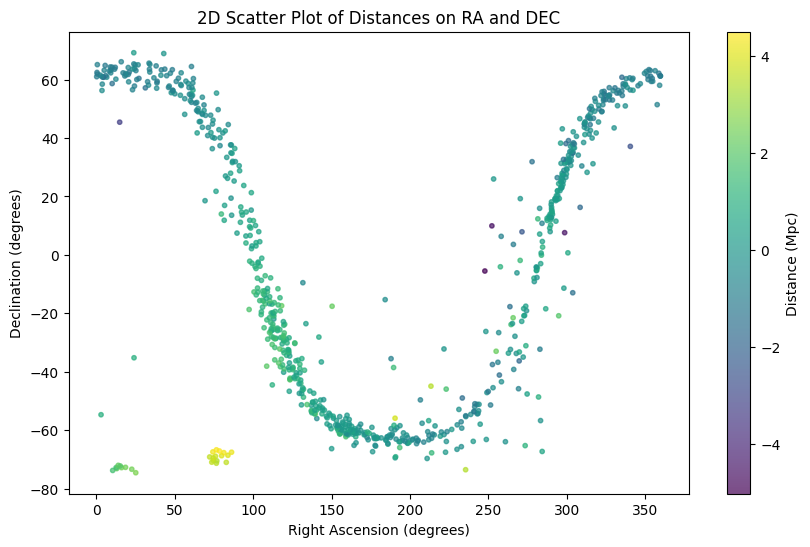

In [13]:
from matplotlib.colors import LogNorm

# Filter out rows with NaN in the RVavg column
filtered_table = cepheids[0][~cepheids[0]['RVavg'].mask]

# Extract RA, DEC, and distances for the filtered table
filtered_ra = filtered_table['RA_ICRS']
filtered_dec = filtered_table['DE_ICRS']
filtered_redshifts = filtered_table['RVavg'] / c
filtered_redshifts = filtered_redshifts[~filtered_redshifts.mask]
filtered_distances = filtered_redshifts * c / H0

print(max(filtered_distances))

# Create a 2D scatter plot with color representing distances
plt.figure(figsize=(10, 6))
scatter = plt.scatter(filtered_ra, filtered_dec, c=filtered_distances, cmap='viridis', s=10, alpha=0.7)

# Add colorbar and labels
plt.colorbar(scatter, label='Distance (Mpc)')
plt.xlabel('Right Ascension (degrees)')
plt.ylabel('Declination (degrees)')
plt.title('2D Scatter Plot of Distances on RA and DEC')

# Show the plot
plt.show()

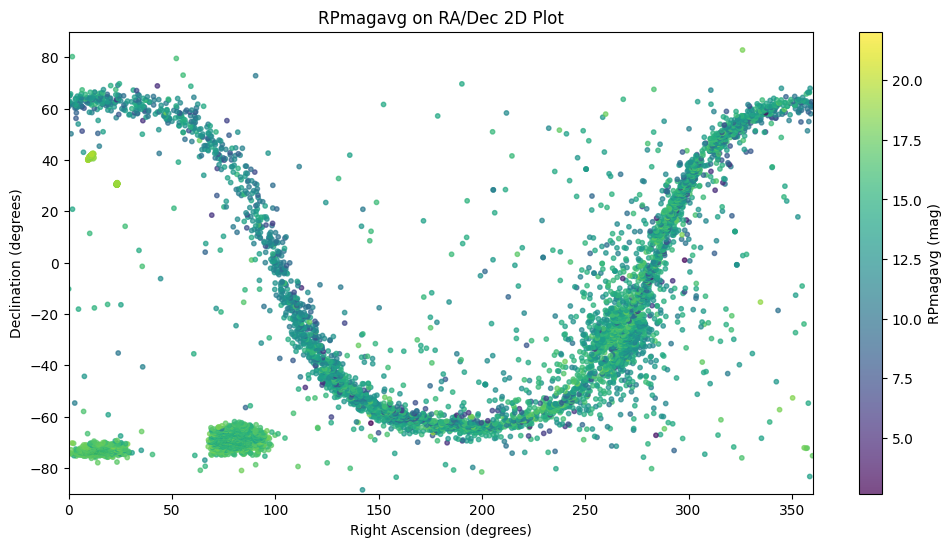

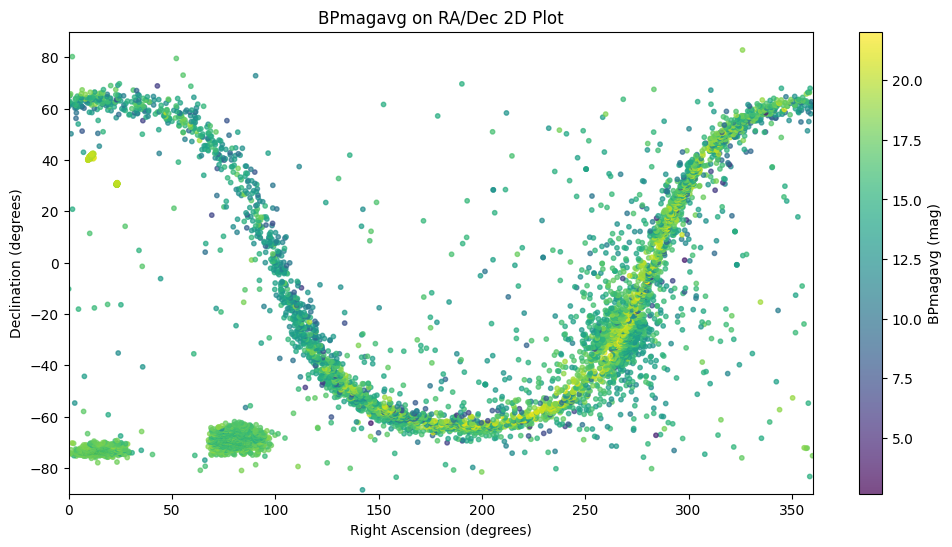

In [14]:
rp_mag = cepheids[0]['RPmagavg']
bp_mag = cepheids[0]['BPmagavg']
ra_values = cepheids[0]['RA_ICRS']
dec_values = cepheids[0]['DE_ICRS']

# Determine the common color scale limits
vmin = min(rp_mag.min(), bp_mag.min())
vmax = max(rp_mag.max(), bp_mag.max())

# Create a scatter plot for RPmagavg
plt.figure(figsize=(12, 6))
scatter_rp = plt.scatter(ra_values, dec_values, c=rp_mag, cmap='viridis', s=10, alpha=0.7, vmin=vmin, vmax=vmax)
plt.colorbar(scatter_rp, label='RPmagavg (mag)')
plt.xlabel('Right Ascension (degrees)')
plt.ylabel('Declination (degrees)')
plt.title('RPmagavg on RA/Dec 2D Plot')
plt.xlim(0, 360)
plt.ylim(-90, 90)
plt.show()

# Create a scatter plot for BPmagavg
plt.figure(figsize=(12, 6))
scatter_bp = plt.scatter(ra_values, dec_values, c=bp_mag, cmap='viridis', s=10, alpha=0.7, vmin=vmin, vmax=vmax)
plt.colorbar(scatter_bp, label='BPmagavg (mag)')
plt.xlabel('Right Ascension (degrees)')
plt.ylabel('Declination (degrees)')
plt.title('BPmagavg on RA/Dec 2D Plot')
plt.xlim(0, 360)
plt.ylim(-90, 90)
plt.show()


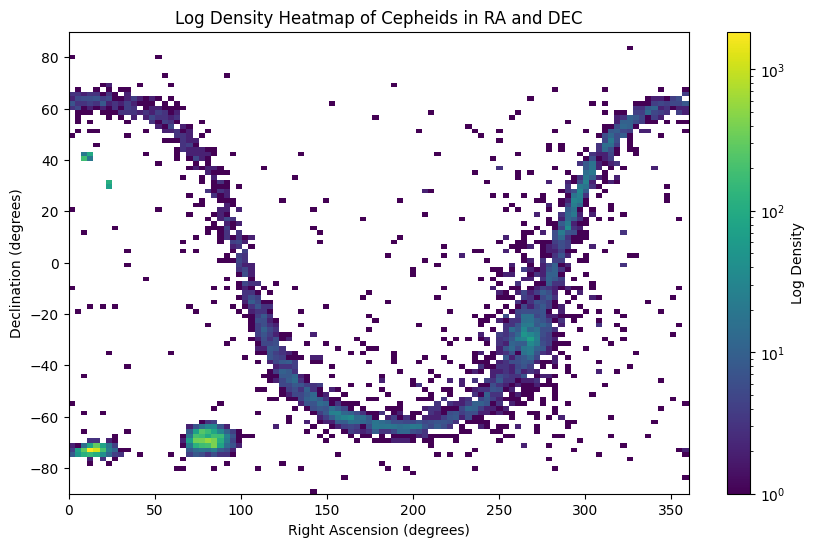

In [15]:
from matplotlib.colors import LogNorm

# Create a 2D histogram with logarithmic density
plt.figure(figsize=(10, 6))
plt.hist2d(ra_values, dec_values, bins=(100, 100), cmap='viridis', norm=LogNorm(), range=[[0, 360], [-90, 90]])

# Add colorbar and labels
plt.colorbar(label='Log Density')
plt.xlabel('Right Ascension (degrees)')
plt.ylabel('Declination (degrees)')
plt.title('Log Density Heatmap of Cepheids in RA and DEC')

# Show the plot
plt.show()


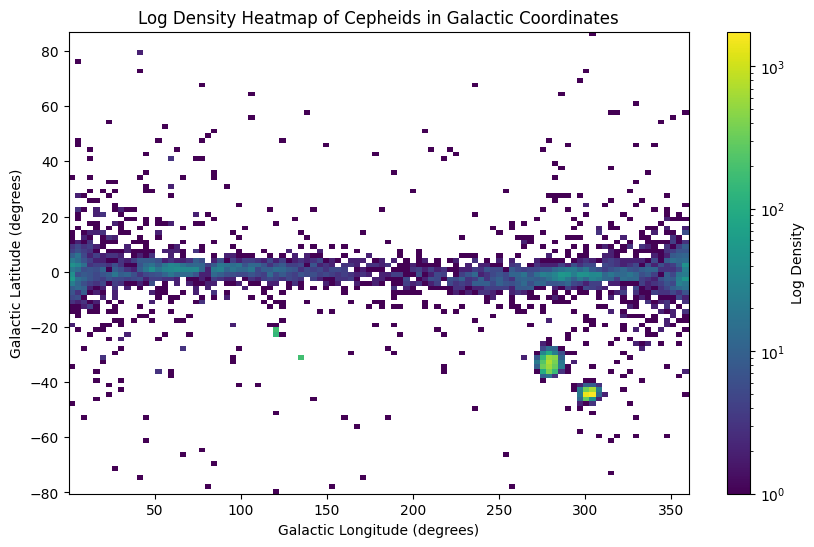

In [54]:
from astropy.coordinates import SkyCoord

# Convert RA and DEC to Galactic coordinates
coords = SkyCoord(ra=ra_values, dec=dec_values, unit='deg', frame='icrs')
galactic_l = coords.galactic.l.deg
galactic_b = coords.galactic.b.deg

# Create a 2D histogram with logarithmic density
plt.figure(figsize=(10, 6))
plt.hist2d(galactic_l, galactic_b, bins=(100, 100), cmap='viridis', norm=LogNorm())

# Add colorbar and labels
plt.colorbar(label='Log Density')
plt.xlabel('Galactic Longitude (degrees)')
plt.ylabel('Galactic Latitude (degrees)')
plt.title('Log Density Heatmap of Cepheids in Galactic Coordinates')

# Show the plot
plt.show()

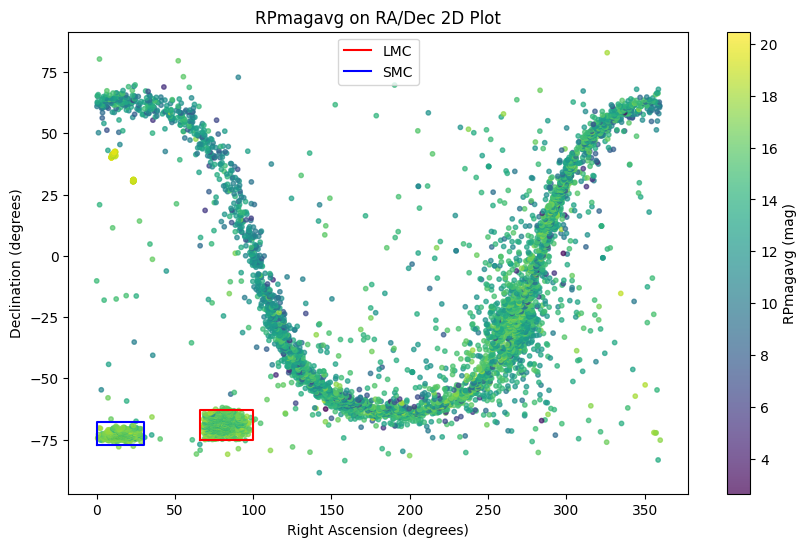

In [62]:
# Define the coordinates for the LMC and SMC
lmc_ra_range = [66, 100]  # Approximate RA range for the LMC
lmc_dec_range = [-75, -63]  # Approximate Dec range for the LMC

smc_ra_range = [0, 30]  # Approximate RA range for the SMC
smc_dec_range = [-77, -68]  # Approximate Dec range for the SMC

# Create the scatter plot of RA and Dec
plt.figure(figsize=(10, 6))
scatter = plt.scatter(ra_values, dec_values, c=rp_mag, cmap='viridis', s=10, alpha=0.7)
plt.colorbar(scatter, label='RPmagavg (mag)')
plt.xlabel('Right Ascension (degrees)')
plt.ylabel('Declination (degrees)')
plt.title('RPmagavg on RA/Dec 2D Plot')

# Draw a box around the LMC
plt.plot([lmc_ra_range[0], lmc_ra_range[1], lmc_ra_range[1], lmc_ra_range[0], lmc_ra_range[0]],
         [lmc_dec_range[0], lmc_dec_range[0], lmc_dec_range[1], lmc_dec_range[1], lmc_dec_range[0]],
         color='red', label='LMC')

# Draw a box around the SMC
plt.plot([smc_ra_range[0], smc_ra_range[1], smc_ra_range[1], smc_ra_range[0], smc_ra_range[0]],
         [smc_dec_range[0], smc_dec_range[0], smc_dec_range[1], smc_dec_range[1], smc_dec_range[0]],
         color='blue', label='SMC')

# Add a legend
plt.legend()

# Show the plot
plt.show()

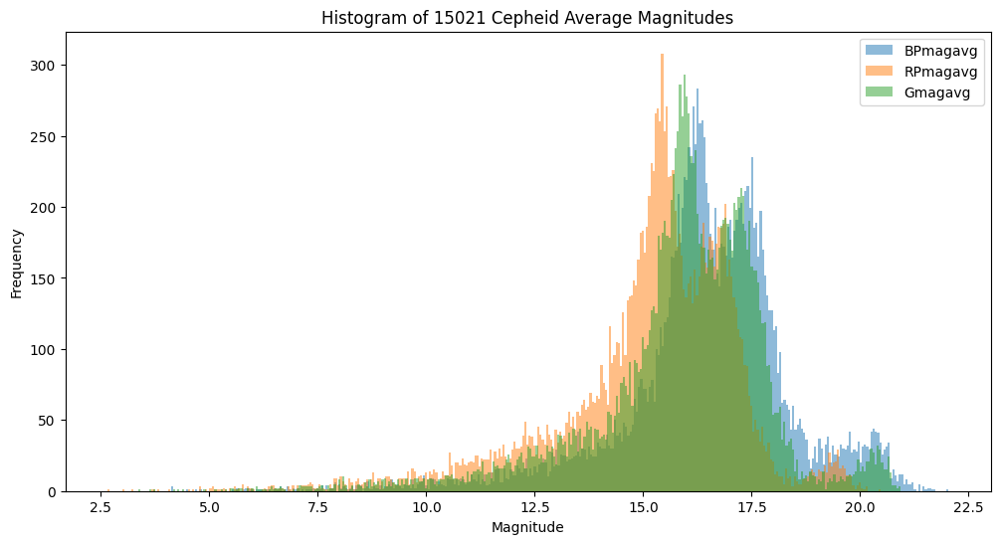

In [17]:
# Define the binning width
bin_width = 0.05

# Extract BPmagavg and RPmagavg columns
bp_mag = cepheids[0]['BPmagavg']
rp_mag = cepheids[0]['RPmagavg']
g_mag = cepheids[0]['Gmagavg']

# Set the figure size to make the plot wider
plt.figure(figsize=(12, 6))

# Create the histogram
plt.hist(bp_mag, bins=int((max(bp_mag) - min(bp_mag)) / bin_width), alpha=0.5, label='BPmagavg')
plt.hist(rp_mag, bins=int((max(rp_mag) - min(rp_mag)) / bin_width), alpha=0.5, label='RPmagavg')
plt.hist(g_mag, bins=int((max(g_mag) - min(g_mag)) / bin_width), alpha=0.5, label='Gmagavg')

# Add labels and legend
plt.xlabel('Magnitude')
plt.ylabel('Frequency')
plt.legend()
plt.title(f'Histogram of {len(cepheids[0])} Cepheid Average Magnitudes')

# Show the plot
plt.show()

# Crossmatching (WIP)

### Mast API:

In [ ]:
## [Mast Query]
def mast_query(request):
    """Perform a MAST query.

        Parameters
        ----------
        request (dictionary): The MAST request json object

        Returns head,content where head is the response HTTP headers, and content is the returned data"""

    # Base API url
    request_url='https://mast.stsci.edu/api/v0/invoke'

    # Grab Python Version
    version = ".".join(map(str, sys.version_info[:3]))

    # Create Http Header Variables
    headers = {"Content-type": "application/x-www-form-urlencoded",
               "Accept": "text/plain",
               "User-agent":"python-requests/"+version}

    # Encoding the request as a json string
    req_string = json.dumps(request)
    req_string = urlencode(req_string)

    # Perform the HTTP request
    resp = requests.post(request_url, data="request="+req_string, headers=headers)

    # Pull out the headers and response content
    head = resp.headers
    content = resp.content.decode('utf-8')

    return head, content
## [Mast Query]


## [Download Request]
def download_request(payload, filename, download_type="file"):
    request_url='https://mast.stsci.edu/api/v0.1/Download/' + download_type
    resp = requests.post(request_url, data=payload)

    with open(filename,'wb') as FLE:
        FLE.write(resp.content)

    return filename
## [Download Request]

## [Set Filters]
def set_filters(parameters):
    return [{"paramName":p, "values":v} for p,v in parameters.items()]
## [Set Filters]

## [Set Min/Max]
def set_min_max(min, max):
    return [{'min': min, 'max': max}]
## [Set Min/Max]

## [Json to csv]
def mast_json2csv(json):
    csv_str =  ",".join([x['name'] for x in json['fields']])
    csv_str += "\n"
    csv_str += ",".join([x['type'] for x in json['fields']])
    csv_str += "\n"

    col_names = [x['name'] for x in json['fields']]
    for row in json['data']:
        csv_str += ",".join([str(row.get(col,"nul")) for col in col_names]) + "\n"

    return csv_str
## [Json to csv]


## [Json to astropy]
from astropy.table import Table
import numpy as np

def mast_json2table(json_obj):

    data_table = Table()

    for col,atype in [(x['name'],x['type']) for x in json_obj['fields']]:
        if atype=="string":
            atype="str"
        if atype=="boolean":
            atype="bool"
        data_table[col] = np.array([x.get(col,None) for x in json_obj['data']],dtype=atype)

    return data_table
## [Json to astropy]


## [Name Resolver]
def resolve_name():

    request = {'service':'Mast.Name.Lookup',
               'params':{'input':'M101',
                         'format':'json'},
    }

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [Name Resolver]

## [List Missions]
def list_caom_missions():

    request = {
        'service':'Mast.Missions.List',
        'params':{},
        'format':'json'
    }

    headers, out_string = mast_query(request)

    out_data = [x['distinctValue'] for x in json.loads(out_string)['data']]

    return out_data
## [List Missions]

## [CAOM Cone Search]
def caom_cone_search():
    cachebreaker = time.strftime("%Y-%m-%d %H:%M:%S", time.gmtime())
    request = {'service':'Mast.Caom.Cone',
               'params':{'ra':254.28746,
                         'dec':-4.09933,
                         'radius': 0.2,
                         'cachebreaker': cachebreaker},
               'format':'json',
               'pagesize':5000,
               'page':1,
               'removenullcolumns':True,
               'timeout':3,
               'cachebreaker': cachebreaker}

    status = 'EXECUTING'
    while status == 'EXECUTING':
        headers, out_string = mast_query(request)
        out_data = json.loads(out_string)
        status = out_data['status']
        print(status)

    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data
## [CAOM Cone Search]

## [VO Cone Search]
def vo_cone_search():

    request = {'service':'Vo.Hesarc.DatascopeListable',
               'params':{'ra':254.28746,
                         'dec':-4.09933,
                         'radius':0.2},
               'format':'json',
               'removenullcolumns':True}

    all_data = []
    start_time = time.time()

    while True:
        headers, out_string = mast_query(request)
        out_data = json.loads(out_string)
        all_data.append(out_data)
        if out_data['status'] != "EXECUTING":
            break
        if time.time() - start_time > 30:
            print("Working...")
            start_time = time.time()
        time.sleep(10)

    return all_data
## [VO Cone Search]

## [HSC V2 Cone Search]
def hscV2_cone_search():

    request = {'service':'Mast.Hsc.Db.v2',
               'params':{'ra':254.287,
                         'dec':-4.09933,
                         'radius':0.2,
                         'nr':5000,
                         'ni':1,
                         'magtype':1},
               'format':'json',
               'pagesize':1000,
               'page':1,
               'removenullcolumns':True}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [HSC V2 Cone Search]

## [HSC V3 Cone Search]
def hscV3_cone_search():

    request = {'service':'Mast.Hsc.Db.v3',
               'params':{'ra':254.287,
                         'dec':-4.09933,
                         'radius':0.2,
                         'nr':5000,
                         'ni':1,
                         'magtype':1},
               'format':'json',
               'pagesize':1000,
               'page':1,
               'removenullcolumns':True}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [HSC V3 Cone Search]

## [GAIA DR1 Cone Search]
def gaiaDR1_cone_search():
    request = {'service':'Mast.Catalogs.GaiaDR1.Cone',
               'params':{'ra':254.287,
                         'dec':-4.09933,
                         'radius':0.2},
               'format':'json',
               'pagesize':1000,
               'page':5}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [GAIA DR1 Cone Search]


### [GAIA DR2 Cone Search]
def gaiaDR2_cone_search():
    request = {'service':'Mast.Catalogs.GaiaDR2.Cone',
               'params':{'ra':254.287,
                         'dec':-4.09933,
                         'radius':0.2},
               'format':'json',
               'pagesize':1000,
               'page':5}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [GAIA DR2 Cone Search]


## [TGAS Cone Search]
def tgas_cone_search():
    request = { "service":"Mast.Catalogs.Tgas.Cone",
                "params":{
                    "ra":254.28746,
                    "dec":-4.09933,
                    "radius":0.2},
                "format":"json",
                "timeout":10}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [TGAS Cone Search]

## [GALEX Cone Search]
def galex_cone_search():
    request = { "service":"Mast.Galex.Catalog",
                "params":{
                    "ra":254.28746,
                    "dec":-4.09933,
                    "radius":0.2},
                "format":"json",
                "timeout":10}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [GALEX Cone Search]

## [TIC Cone Search]
def tic_cone_search():
    request = { "service":"Mast.Catalogs.Tic.Cone",
                "params":{
                    "ra":254.28746,
                    "dec":-4.09933,
                    "radius":0.2},
                "format":"json",
                "timeout":10}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [TIC Cone Search]

## [TIC Advanced Search]
def tic_advanced_search():
    filts = set_filters({
                "dec" : set_min_max(-90, -30),
                "Teff" : set_min_max(4250, 4500),
                "logg" : set_min_max(4.4, 5.0),
                "Tmag" : set_min_max(8, 10)
            })

    request = {"service":"Mast.Catalogs.Filtered.Tic",
               "format":"json",
               "params":{
                   "columns":"COUNT_BIG(*)",
                   "filters": filts
               }}

    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data
## [TIC Advanced Search]

## [TIC Advanced Search (Data Only)]
def tic_advanced_search_rows():
    filts = set_filters({
                "dec" : set_min_max(-90, -30),
                "Teff" : set_min_max(4250, 4500),
                "logg" : set_min_max(4.4, 5.0),
                "Tmag" : set_min_max(8, 10)
            })

    request = {"service":"Mast.Catalogs.Filtered.Tic.Rows",
               "format":"json",
               "params":{
                   "columns":"*",
                   "filters": filts
               }}

    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data
## [TIC Advanced Search (Data Only)]

## [TIC Advanced Search Position]
def tic_advanced_search_position():
    filts = set_filters({
                "Teff" : set_min_max(4250, 4500),
                "logg" : set_min_max(4.4, 5.0),
                "Tmag" : set_min_max(8, 10)
            })

    request = {"service":"Mast.Catalogs.Filtered.Tic.Position",
               "format":"json",
               "params":{
                   "columns":"BIG_COUNTS(*)",
                   "filters": filts,
                   "ra": 210.8023,
                   "dec": 54.349,
                   "radius": .2
               }}

    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data
## [TIC Advanced Search Position]

## [TIC Advanced Search Position (Data Only)]
def tic_advanced_search_position_rows():
    filts = set_filters({
                "Teff" : set_min_max(4250, 4500),
                "logg" : set_min_max(4.4, 5.0),
                "Tmag" : set_min_max(8, 10)
            })

    request = {"service":"Mast.Catalogs.Filtered.Tic.Position.Rows",
               "format":"json",
               "params":{
                   "columns":"*",
                   "filters": filts,
                   "ra": 210.8023,
                   "dec": 54.349,
                   "radius": .2
               }}

    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data
## [TIC Advanced Search Position (Data Only)]

## [CTL Cone Search]
def ctl_cone_search():
    request = { "service":"Mast.Catalogs.Ctl.Cone",
                "params":{
                    "ra":254.28746,
                    "dec":-4.09933,
                    "radius":0.2},
                "format":"json",
                "timeout":10}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [CTL Cone Search]

## [CTL Advanced Search]
def ctl_advanced_search():
    filts = set_filters({
                "dec" : set_min_max(-90, -30),
                "Teff" : set_min_max(4250, 4500),
                "logg" : set_min_max(4.4, 5.0),
                "Tmag" : set_min_max(8, 10)
            })

    request = {"service":"Mast.Catalogs.Filtered.Ctl",
               "format":"json",
               "params":{
                   "columns": "COUNT_BIG(*)",
                   "filters":filts
               }}

    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data
## [CTL Advanced Search]

## [CTL Advanced Search (Data Only)]
def ctl_advanced_search_rows():
    filts = set_filters({
                "dec" : set_min_max(-90, -30),
                "Teff" : set_min_max(4250, 4500),
                "logg" : set_min_max(4.4, 5.0),
                "Tmag" : set_min_max(8, 10)
            })

    request = {"service":"Mast.Catalogs.Filtered.Ctl.Rows",
               "format":"json",
               "params":{
                   "columns": "*",
                   "filters": filts
               }}

    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data
## [CTL Advanced Search (Data Only)]

## [CTL Advanced Search Position]
def ctl_advanced_search_position():
    filts = set_filters({
                "Teff" : set_min_max(4250, 4500),
                "logg" : set_min_max(4.4, 5.0),
                "Tmag" : set_min_max(8, 10)
            })

    request = {"service":"Mast.Catalogs.Filtered.Ctl.Position",
               "format":"json",
               "params":{
                   "columns":"COUNT_BIG(*)",
                   "filters": filts,
                   "ra": 210.8023,
                   "dec": 54.349,
                   "radius": .2
               }}

    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data
## [CTL Advanced Search Position]

## [CTL Advanced Search Position (Data Only)]
def ctl_advanced_search_position_rows():
    filts = set_filters({
                "Teff" : set_min_max(4250, 4500),
                "logg" : set_min_max(4.4, 5.0),
                "Tmag" : set_min_max(8, 10)
            })

    request = {"service":"Mast.Catalogs.Filtered.Ctl.Position.Rows",
               "format":"json",
               "params":{
                   "columns":"*",
                   "filters": filts,
                   "ra": 210.8023,
                   "dec": 54.349,
                   "radius": .2
               }}

    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data
## [CTL Advanced Search Position (Data Only)]

## [DD Cone Search]
def dd_cone_search():
    request = { "service":"Mast.Catalogs.DiskDetective.Cone",
                "params":{
                    "ra":254.28746,
                    "dec":-4.09933,
                    "radius":0.2},
                "format":"json",
                "timeout":10}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [DD Cone Search]

## [DD Advanced Search]
def dd_advanced_search():
    filts = set_filters({
                "classifiers": set_min_max(10, 18),
                "oval": set_min_max(15, 76)
            })

    request = {"service":"Mast.Catalogs.Filtered.DiskDetective",
               "format":"json",
               "params":{
                   "filters": filts
               }}

    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data
## [DD Advanced Search]

## [DD Advanced Search Position]
def dd_advanced_search_position():
    filts = set_filters({
                "classifiers": set_min_max(10, 18)
            })

    request = {"service":"Mast.Catalogs.Filtered.DiskDetective.Position",
               "format":"json",
               "params":{
                   "filters": filts,
                   "ra": 86.6909,
                   "dec": 0.079,
                   "radius": .2
               }}

    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data
## [DD Advanced Search Position]

## [DD Advanced Search Counts]
def dd_advanced_search_counts():
    filts = set_filters({
                "classifiers": set_min_max(10, 18),
                "oval": set_min_max(15, 76)
            })

    request = {"service":"Mast.Catalogs.Filtered.DiskDetective.Count",
               "format":"json",
               "params":{
                   "filters":filts
               }}

    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data
## [DD Advanced Search Counts]

## [DD Advanced Search Position Counts]
def dd_advanced_search_position_counts():
    filts = set_filters({
                "classifiers": set_min_max(10, 18),
            })

    request = {"service":"Mast.Catalogs.Filtered.DiskDetective.Position.Count",
               "format":"json",
               "params":{
                   "filters": filts,
                   "ra": 86.6909,
                   "dec": 0.079,
                   "radius": .2
               }}

    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data
## [DD Advanced Search Position Counts]

## [WFC3 PSF UVIS Filtered]
def get_wfc3uvis_matches():
    filts = set_filters({
                'psf_x_center': set_min_max(6,18),
                'filter': ['F814W', 'F390W']
            })

    request = {"service":"Mast.Catalogs.Filtered.Wfc3Psf.Uvis",
               "format":"json",
               "params":{
                    "columns": "*",
                    "filters": filts
               }}

    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data
## [WFC3 PSF UVIS Filtered]

## [WFC3 PSF IR Filtered]
def get_wfc3ir_matches():
    filts = set_filters({
                'psf_x_center': set_min_max(6,18),
                'filter': ['F814W', 'F390W']
            })

    request = {"service":"Mast.Catalogs.Filtered.Wfc3Psf.Ir",
               "format":"json",
               "params":{
                    "columns":"*",
                    "filters":filts
               }}

    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data
## [WFC3 PSF IR Filtered]

## [WFPC2 PSF UVIS Filtered]
def get_wfpc2uvis_matches():
    filts = set_filters({
                'psf_x_center': set_min_max(6,18),
                'filter': ['F814W', 'F390W']
            })

    request = {"service":"Mast.Catalogs.Filtered.Wfc3Psf.Uvis",
               "format":"json",
               "params":{
                   "columns": "*",
                   "filters": filts
               }}

    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data
## [WFPC2 PSF UVIS Filtered]

## [Advanced Search]
def advanced_search_counts():
    request = {"service":"Mast.Caom.Filtered",
               "format":"json",
               "params":{
                   "columns":"COUNT_BIG(*)",
                   "filters":[
                       {"paramName":"filters",
                        "values":["NUV","FUV"],
                        "separator":";"
                       },
                       {"paramName":"t_max",
                        "values":[{"min":52264.4586,"max":54452.8914}], #MJD
                       },
                       {"paramName":"obsid",
                        "values":[],
                        "freeText":"%200%"}
                   ]}}

    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data


def advanced_search():
    filts = set_filters({
                "dataproduct_type": ["image"],
                "proposal_pi": ["Osten"]
                })

    request = {"service":"Mast.Caom.Filtered",
               "format":"json",
               "params":{
                   "columns":"*",
                   "filters":filts,
                   "obstype":"all"
               }}

    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data
## [Advanced Search]


## [Advanced Search Position]
def advanced_search_with_position_counts():
    filts = set_filters({"dataproduct_type": ["cube", "image"]})

    request = { "service":"Mast.Caom.Filtered.Position",
                "format":"json",
                "params":{
                    "columns":"COUNT_BIG(*)",
                    "filters":filts,
                    "position":"210.8023, 54.349, 5"
                }}

    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data


def advanced_search_with_position():
    filts = set_filters({"dataproduct_type": ["cube"]})

    request = {"service":"Mast.Caom.Filtered.Position",
               "format":"json",
               "params":{
                   "columns":"*",
                   "filters":filts,
                   "position":"210.8023, 54.349, 0.24"
               }}

    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data
## [Advanced Search Position]


## [HSC Spectra]
def hsc_spectra_search():

    request = {'service':'Mast.HscSpectra.Db.All',
               'format':'votable'}

    headers, out_string = mast_query(request)

    return out_string
## [HSC Spectra]

## [HSC Spectra Download]
def download_hsc_spectra():

    # grab all the hsc spectra
    request = {'service':'Mast.HscSpectra.Db.All',
               'format':'json'}
    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    # download the first 3 spects
    for spec in out_data['data'][:3]:
        # build the url
        if spec['SpectrumType'] < 2:
            dataurl = 'https://hla.stsci.edu/cgi-bin/getdata.cgi?config=ops&dataset=' \
                      + spec['DatasetName']
            filename = spec['DatasetName']
        else:
            dataurl = 'https://hla.stsci.edu/cgi-bin/ecfproxy?file_id=' \
                      + spec['DatasetName'] + '.fits'
            filename = spec['DatasetName'] + '.fits'

        # download
        out_file = download_request(dataurl, filename)

        print(out_file)
## [HSC Spectra Download]


## [HSC V2 Matches]
def get_hscv2_matches():
    # perform the HSC search
    result = hscV2_cone_search()
    data = result['data']

    # get the match id
    matchId = data[0]['MatchID']

    # get detailed results for chosen match id
    request = {'service':'Mast.HscMatches.Db.v2',
               'params':{'input':matchId},
               'format':'json',
               'page':1,
               'pagesize':4}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [HSC V2 Matches]

## [HSC V3 Matches]
def get_hscv3_matches():
    # perform the HSC search
    result = hscV3_cone_search()
    data = result['data']

    # get the match id
    matchId = data[0]['MatchID']

    # get detailed results for chosen match id
    request = {'service':'Mast.HscMatches.Db.v3',
               'params':{'input':matchId},
               'format':'json',
               'page':1,
               'pagesize':4}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [HSC V3 Matches]


## [Get VO Data]
def get_vo_data():

    # perform vo cone search
    vo_data = vo_cone_search()
    vo_json = vo_data[0]

    row = json['data'][2]
    url = row['tableURL']

    request = {'service':'Vo.Generic.Table',
               'params':{'url':url},
               'format':'json',
               'page':1,
               'pagesize':1000}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [Get VO Data]


## [CAOM Crossmatch]
def crossmatch_from_cone_search():

    # This is a json object
    crossmatch_input = caom_cone_search()

    request =  {"service":"Mast.Caom.Crossmatch",
                "data":crossmatch_input,
                "params":{
                    "raColumn":"s_ra",
                    "decColumn":"s_dec",
                    "radius":0.001
                },
                "pagesize":1000,
                "page":1,
                "format":"json",
                "removecache":True}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data

def crossmatch_from_minimal_json():

    crossmatch_input = {"fields":[{"name":"ra","type":"float"},
                                  {"name":"dec","type":"float"}],
                        "data":[{"ra":210.8,"dec":54.3}]}

    request =  {"service":"Mast.Caom.Crossmatch",
                "data":crossmatch_input,
                "params":{
                    "raColumn":"ra",
                    "decColumn":"dec",
                    "radius":0.001
                },
                "pagesize":1000,
                "page":1,
                "format":"json",
                "clearcache":True}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [CAOM Crossmatch]

## [Galex Crossmatch]
def galex_crossmatch():

    # This is a json object
    crossmatch_input = {"fields":[{"name":"s_ra","type":"float"},
                                  {"name":"s_dec","type":"float"}],
                        "data":[{"s_ra":210.8,"s_dec":54.3}]}

    request =  {"service":"Mast.Galex.Crossmatch",
                "data":crossmatch_input,
                "params":{
                    "raColumn":"s_ra",
                    "decColumn":"s_dec",
                    "radius":0.01
                },
                "pagesize":1000,
                "page":1,
                "format":"json"}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [Galex Crossmatch]

## [sdss Crossmatch]
def sdss_crossmatch():

    # This is a json object
    crossmatch_input = {"fields":[{"name":"ra","type":"float"},
                                  {"name":"dec","type":"float"}],
                        "data":[{"ra":337.10977,"dec":30.30261}]}

    request ={"service":"Mast.Sdss.Crossmatch",
              "data":crossmatch_input,
              "params": {
                  "raColumn":"ra",
                  "decColumn":"dec",
                  "radius":0.01
              },
              "format":"json",
              "pagesize":1000,
              "page":1}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [sdss Crossmatch]


## [2mass Crossmatch]
def twoMass_crossmatch():

    # This is a json object
    crossmatch_input = {"fields":[{"name":"ra","type":"float"},
                                  {"name":"dec","type":"float"}],
                        "data":[{"ra":210.88447,"dec":54.332}]}

    request =  {"service":"Mast.2Mass.Crossmatch",
                "data":crossmatch_input,
                "params":{
                    "raColumn":"ra",
                    "decColumn":"dec",
                    "radius":0.04
                },
                "pagesize":1000,
                "page":1,
                "format":"json"}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [2mass Crossmatch]


## [hsc2 Crossmatch]
def hscMagAper2_crossmatch():

    # This is a json object
    crossmatch_input = {"fields":[{"name":"ra","type":"float"},
                                  {"name":"dec","type":"float"}],
                        "data":[{"ra":210.8,"dec":54.3}]}

    request =  {"service":"Mast.Hsc.Crossmatch.MagAper2v3",
                "data":crossmatch_input,
                "params":{
                    "raColumn":"ra",
                    "decColumn":"dec",
                    "radius":0.001
                },
                "pagesize":1000,
                "page":1,
                "format":"json"}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [hsc2 Crossmatch]

## [hscauto Crossmatch]
def hscMagAuto_crossmatch():

    # This is a json object
    crossmatch_input = {"fields":[{"name":"ra","type":"float"},
                                  {"name":"dec","type":"float"}],
                        "data":[{"ra":210.8,"dec":54.3}]}

    request =  {"service":"Mast.Hsc.Crossmatch.MagAutov3",
                "data":crossmatch_input,
                "params":{
                    "raColumn":"ra",
                    "decColumn":"dec",
                    "radius":0.001
                },
                "pagesize":1000,
                "page":1,
                "format":"json"}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [hscauto Crossmatch]

## [gaia DR1 Crossmatch]
def gaiaDR1_crossmatch():

    # This is a json object
    crossmatch_input = {"fields":[{"name":"ra","type":"float"},
                                  {"name":"dec","type":"float"}],
                        "data":[{"ra":210.8,"dec":54.3}]}

    request =  {"service":"Mast.GaiaDR1.Crossmatch",
                "data":crossmatch_input,
                "params":{
                    "raColumn":"ra",
                    "decColumn":"dec",
                    "radius":0.1
                },
                "format":"json"}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [gaia DR1 Crossmatch]

## [gaia DR2 Crossmatch]
def gaiaDR2_crossmatch():

    # This is a json object
    crossmatch_input = {"fields":[{"name":"ra","type":"float"},
                                 {"name":"dec","type":"float"}],
                       "data":[{"ra":210.8,"dec":54.3}]}

    request =  {"service":"Mast.GaiaDR2.Crossmatch",
                "data":crossmatch_input,
                "params":{
                    "raColumn":"ra",
                    "decColumn":"dec",
                    "radius":0.1
                },
                "format":"json"}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [gaia DR2 Crossmatch]

## [tgas Crossmatch]
def tgas_crossmatch():

    # This is a json object
    crossmatch_input = {"fields":[{"name":"ra","type":"float"},
                                 {"name":"dec","type":"float"}],
                       "data":[{"ra":211.09,"dec":54.3228}]}

    request =  {"service":"Mast.Tgas.Crossmatch",
                "data":crossmatch_input,
                "params":{
                    "raColumn":"ra",
                    "decColumn":"dec",
                    "radius":0.2
                },
                "format":"json"}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [tgas Crossmatch]

## [tic Crossmatch]
def tic_crossmatch(ra, dec):

    # This is a json object
    crossmatch_input = {"fields":[{"name":"ra","type":"float"},
                                 {"name":"dec","type":"float"}],
                       "data":[{"ra":ra,"dec":dec}]}

    request =  {"service":"Mast.Tic.Crossmatch",
                "data":crossmatch_input,
                "params":{
                    "raColumn":"ra",
                    "decColumn":"dec",
                    "radius":0.2
                },
                "format":"json"}

    headers,out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [tic Crossmatch]

## [ctl Crossmatch]
def ctl_crossmatch():

    # This is a json object
    crossmatch_input = {"fields":[{"name":"ra","type":"float"},
                                 {"name":"dec","type":"float"}],
                       "data":[{"ra":211.09,"dec":54.3228}]}

    request =  {"service":"Mast.Ctl.Crossmatch",
                "data":crossmatch_input,
                "params":{
                    "raColumn":"ra",
                    "decColumn":"dec",
                    "radius":0.2
                },
                "format":"json"}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [ctl Crossmatch]

## [Product Query]
def get_caom_products():

    # perform the CAOM search
    result = caom_cone_search()
    data = result['data']

    # get the product group id (obsid)
    obsid = data[1]['obsid']

    # get detailed results for chosen match id
    request = {'service':'Mast.Caom.Products',
               'params':{'obsid':obsid},
               'format':'json',
               'pagesize':4,
               'page':1}

    headers, out_string = mast_query(request)

    out_data = json.loads(out_string)

    return out_data
## [Product Query]


## [Download Product]
def download_multiple_products():

    # get data products
    result = get_caom_products()
    product_list = result['data']

    # Collecting the parameters you need
    url_list = [("uri", url) for url in product_list['dataURI'][:2]]
    extension = ".tar.gz"
    filename = "mastData"

    # download the file
    bundle = download_request(url_list, filename=local_path, download_type="bundle")

    return bundle
## [Download Product]


## [Direct Download]
def download_individual_products():

    # get data products
    result = get_caom_products()
    data = result['data']
    product = data[0]

    # Make the local file name and make sure the directory is there
    local_path = os.path.join("mastFiles", product['obs_collection'], product['obs_id'])
    if not os.path.exists(local_path):
        os.makedirs(local_path)
    print(local_path)
    local_path = os.path.join(local_path,  os.path.basename(product['productFilename']))
    print(local_path)

    # download the file
    download_filename = download_request(product['dataURI'], filename=local_path)

    return download_filename
## [Direct Download]

## [JWST Filtered Nircam]
def jwst_nircam_search():
    filts = set_filters({
                'prop_dec': set_min_max(0, 90),
                'mu_dec': set_min_max(-10, -2)
            })

    request = {"service":"Mast.JWST.Filtered.Nircam",
               "format":"json",
               "params":{
                    "columns":"COUNT_BIG(*)",
                    "filters":filts
                        }
               }
    headers, out_string = mast_query(request)
    out_data = json.loads(out_string)

    return out_data
## [JWST Filtered Nircam]


### From GAIA Cepheids, query to find TICs

In [18]:
cepheids[0]

Harm,Source,SolID,PF,P1O,Gmagavg,BPmagavg,RPmagavg,RVavg,[M/H],R21G,R31G,phi21G,phi31G,FundFreq1,FundFreq2,P2O,Class,SubClass,ModeClass,MulModeClass,RA_ICRS,DE_ICRS
,,,d,d,mag,mag,mag,km / s,,,,rad,rad,1 / d,1 / d,d,,,,,deg,deg
str4,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str5,str6,str14,str5,float64,float64
Harm,1051896903074455936,375316653866487564,--,0.39669593130038044,14.5680160,14.7327730,14.2757860,--,--,0.087533270,--,5.99213460,--,2.520822426189176735,--,--,DCEP,,FIRST_OVERTONE,,152.42395747221,61.65869216095
Harm,1113929871645836672,375316653866487564,35.0087580724326557,--,11.2319980,11.6559550,10.5568630,--,--,0.383209820,0.2660439600,5.85842280,5.2666845,0.028564280913107892,--,--,T2CEP,RV_TAU,NOT_APPLICABLE,,90.52184792417,72.85143255057
Harm,1171164605830596864,375316653866487564,1.0107451745184679,--,14.2989400,14.5014810,13.8960800,--,--,0.439795820,0.2728704800,4.19245400,2.205416,0.989369056821283288,--,--,T2CEP,BL_HER,NOT_APPLICABLE,,219.55570410593,5.83980877684
Harm,1208200864738741376,375316653866487564,1.1654208717158157,--,11.9085630,12.0419600,11.5998290,--,-0.37171108,0.506305040,0.2685551000,4.20470430,2.1809042,0.858059113466647205,--,--,DCEP,,FUNDAMENTAL,,229.11867976811,16.44430064210
Harm,1248397910338129664,375316653866487564,2.0775633150327733,--,14.7035410,14.9463620,14.2955250,--,-0.07845018,0.416790100,0.1866537500,4.54683900,2.925802,0.481333104394089273,--,--,DCEP,,FUNDAMENTAL,,206.21860421223,19.47084356320
Harm,1303409157136772096,375316653866487564,--,1.29216779470519816,14.7014160,14.9189530,14.3148190,--,--,0.163506750,0.0973890500,3.34002300,0.0041050375,0.773893300930120431,--,--,DCEP,,FIRST_OVERTONE,,245.85353012484,25.83445812864
Harm,1306279466601099904,375316653866487564,9.7077353209185482,--,9.7979765,10.2421410,9.1833240,3.117799,--,0.238466750,--,6.77598240,--,0.103010637078780568,--,--,T2CEP,W_VIR,NOT_APPLICABLE,,253.28602527426,25.97636711752
Harm,1322273271975938304,375316653866487564,2.6651672442780017,--,14.7529730,15.0813740,14.2580020,--,--,0.227791120,0.1025029000,5.08956770,3.1260529,0.375210974901089844,--,--,T2CEP,BL_HER,NOT_APPLICABLE,,242.45271175708,31.98289210546


In [ ]:
# this was taking forever, so either run on a different computer or use a different method :(

found =  []
for i in range(len(cepheids[0])):
    if (i%20 == 0): print(f"Processing row: {i}/{len(cepheids[0])}")
    # Extract RA_ICRS and DEC_ICRS of the first star
    ra_icrs = cepheids[0]['RA_ICRS'][i]
    dec_icrs = cepheids[0]['DE_ICRS'][i]

    # Search for the star using lightkurve
    coords = SkyCoord(ra=ra_icrs, dec=dec_icrs, unit='deg', frame='icrs')
    search_result = lk.search_lightcurve(coords, radius=0.01 * u.deg)

    # Download the light curve if available
    if len(search_result) > 0:
        # Save the result in a CSV file with source and TIC
        search_result_table = search_result.table
        found.append(i)
        search_result_table['Source'] = cepheids[0]['Source'][i]
        search_result_table['TIC'] = search_result_table['TIC'][0]
        search_result_table[['Source', 'TIC']].write('lightcurve_results.csv', format='csv', overwrite=True)
    else:
        print(f"Row {i}: No light curve found for the given coordinates.")


print(f"Found {len(found)} same stars in GAIA and TESS!")

In [ ]:
# in the code above, each search result has these headers

lightkurve_headers = [
    "intentType",
    "obs_collection",
    "provenance_name",
    "instrument_name",
    "project",
    "filters",
    "wavelength_region",
    "target_name",
    "target_classification",
    "obs_id",
    "s_ra",
    "s_dec",
    "dataproduct_type",
    "proposal_pi",
    "calib_level",
    "t_min",
    "t_max",
    "t_exptime",
    "em_min",
    "em_max",
    "obs_title",
    "t_obs_release",
    "proposal_id",
    "proposal_type",
    "sequence_number",
    "s_region",
    "jpegURL",
    "dataURL",
    "dataRights",
    "mtFlag",
    "srcDen",
    "obsid",
    "objID",
    "objID1",
    "distance",
    "exptime",
    "obsID",
    "obs_collection_products",
    "dataproduct_type_products",
    "description",
    "type",
    "dataURI",
    "productType",
    "productGroupDescription",
    "productSubGroupDescription",
    "productDocumentationURL",
    "project_products",
    "prvversion",
    "proposal_id_products",
    "productFilename",
    "size",
    "parent_obsid",
    "dataRights_products",
    "calib_level_products",
    "filters_products",
    "author",
    "mission",
    "#",
    "year",
    "sort_order",
    "Source",
    "TIC",
]

In [ ]:
# crossmatching ONE cepheid with the MAST API
# i = 1
i = 2

ra_icrs = cepheids[0]['RA_ICRS'][i]
dec_icrs = cepheids[0]['DE_ICRS'][i]

print(ra_icrs, dec_icrs)

first_data = tic_crossmatch(ra_icrs, dec_icrs)

219.55570410593 5.83980877684


In [21]:
first_data # i=1,2
first_id = first_data['data'][0]['MatchID']

distincts = []

for i in range(len(first_data['data'])):
    id = first_data['data'][i]['MatchID']
    if id not in distincts: distincts.append(id)

print(distincts)

[402317005, 402316911, 402316912, 402317011, 1000003502, 1000003503, 1000003150, 402316915, 402317002, 1000003666, 402317013, 1000003498, 1000003151, 402317014, 402317003, 402317004, 1000002943, 1000003665, 402317012, 1000003154, 1000003152, 1000002944, 1000003157, 1000003153, 1000003668, 1000003669, 1000003670, 1000002945, 402316920, 1000003667, 402316921, 1000003499, 402316995, 402316907, 402317016, 402317009, 1000003501, 1000003145, 1000003671, 402316904, 1000003149, 402316910, 1000003155, 1000003147, 402316908, 1000003148, 1000003156, 1000003146, 1000003680, 402316914, 402316923, 1000002929, 1000002942, 1000003509, 402317008, 1000003672, 1000003500, 402316918, 1000003140, 1000003174, 402316993, 1000003506, 402317019, 1000002930, 1000003681, 1000003682, 402317006, 1000002927, 1000002928, 1000003674, 1000003139, 1000002939, 1000003684, 1000002941, 1000003511, 402316909, 1000003143, 10002477906, 402316900, 402317020, 1000003675, 402317018, 1000003504, 1000003510, 1000003489, 402317022

In [82]:
# many distinct results for one cepheid, just get the first one and there should be tesscuts.
# light curves are not guaranteed, however. check lightkurve docs for more info on what tesscut and lightcurves are

star = distincts[1]
lk.search_tesscut(f"TIC {star}")

#,mission,year,author,exptime,target_name,distance
,,,,s,,arcsec
0,TESS Sector 51,2022,TESScut,475,TIC 402316911,0.0


In [ ]:
# proof that light curves are not guaranteed to exist, but tesscuts are

from astropy.coordinates import SkyCoord

# Initialize a list to store results
lightcurve_results = []

# Loop through the distinct TIC IDs
for tic_id in distincts:
    print(f"Searching for TIC ID: {tic_id}")

    # Search for the light curve using lightkurve
    search_result = lk.search_lightcurve(f"TIC {tic_id}")

    # If light curves are found, download and store them
    if len(search_result) > 0:
        print(f"Found {len(search_result)} light curves for TIC ID: {tic_id}")
        lightcurve = search_result.download_all()
        lightcurve_results.append((tic_id, lightcurve))
    else:
        print(f"No light curves found for TIC ID: {tic_id}")

# Display the results
print(f"Total TIC IDs with light curves: {len(lightcurve_results)}")

In [ ]:
# try to vectorize and do two in one lump sum
# 1 cepheid: 0.5s, 2 cepheids: 1s. O(n)?

ra1, dec1 = cepheids[0]['RA_ICRS'][1], cepheids[0]['DE_ICRS'][1]
ra2, dec2 = cepheids[0]['RA_ICRS'][2], cepheids[0]['DE_ICRS'][2]

crossmatch_input = {"fields":[{"name":"ra","type":"float"},
                                {"name":"dec","type":"float"}],
                    "data":[{"ra":ra1,"dec":dec1}, {"ra":ra2,"dec":dec2}]}

request =  {"service":"Mast.Tic.Crossmatch",
            "data":crossmatch_input,
            "params":{
                "raColumn":"ra",
                "decColumn":"dec",
                "radius":0.2
            },
            "format":"json"}

headers,out_string = mast_query(request)

out_data = json.loads(out_string)

In [ ]:
# results from vectorising: sort of a mess oops

data = out_data['data']
for i in data:
    print(i)

{'ra': 219.55570410593, 'dec': 5.83980877684, 'MatchID': 402317005, 'MatchRa': 219.555722339059, 'MatchDEC': 5.83982053539485, 'dstArcSec': 0.07781905438127996, 'version': '20190415', 'HIP': None, 'TYC': None, 'UCAC': '480-055058', 'TWOMASS': '14381336+0550233', 'SDSS': None, 'ALLWISE': 'J143813.38+055023.5', 'GAIA': '1171164605830596864', 'APASS': '39260482', 'KIC': None, 'objType': 'STAR', 'typeSrc': 'tmgaia2', 'POSflag': 'tmgaia2', 'pmRA': -4.08476, 'e_pmRA': 0.0469617, 'pmDEC': -2.64151, 'e_pmDEC': 0.0455444, 'PMflag': 'gaia2', 'plx': 0.132978, 'e_plx': 0.0262356, 'PARflag': 'gaia2', 'gallong': 357.780384518481, 'gallat': 56.8649963273491, 'eclong': 215.185608901756, 'eclat': 20.2033341245136, 'Bmag': 15.089, 'e_Bmag': 0.15, 'Vmag': 14.743, 'e_Vmag': 0.172, 'umag': None, 'e_umag': None, 'gmag': None, 'e_gmag': None, 'rmag': None, 'e_rmag': None, 'imag': None, 'e_imag': None, 'zmag': None, 'e_zmag': None, 'Jmag': 13.474, 'e_Jmag': 0.029, 'Hmag': 13.187, 'e_Hmag': 0.035, 'Kmag': 13.1

In [ ]:
# another idea: use astroquery?

from astroquery.mast import Catalogs, Observations

# Retrieve and display metadata for valid query criteria
print(Observations.get_metadata("observations"))
print(Observations.get_metadata("products"))


# Query the TESS Input Catalog (TIC) for Cepheid variable stars
cepheids_query = Catalogs.query_criteria(
    catalog="TIC",
)

cepheids_query.get_metadata()

# Recreating Light Curves

Cepheids from this paper https://iopscience.iop.org/article/10.3847/1538-4365/abd4e3

In [26]:
paper_cepheids = [149346418, 277316761, 294670967, 30033323, 182729973, 182517661, 267184490, 52056743, 33718043, 238891904, 50313785, 389744625, 50310856, 9846652, 33877343, 129710422, 24695633, 234525389, 144046456, 2027094382, 423761480, 197693113, 121469834, 30473478, 141824491, 141870888]

c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 66 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


<Axes: title={'center': 'Target ID: 149346418, Cadence: 91190'}, xlabel='Pixel Column Number', ylabel='Pixel Row Number'>

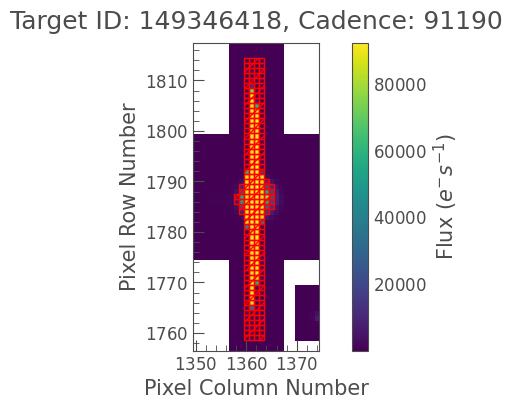

In [46]:
from lightkurve import search_tesscut

cutout_search_result = lk.search_targetpixelfile(f"TIC {paper_cepheids[0]}")
tpf = cutout_search_result.download(quality_bitmask='default')

tpf.plot()


Processing TIC 149346418...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 37 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 277316761...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 37 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 294670967...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 37 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 30033323...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 38 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 182729973...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 6 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 182517661...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 6 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 267184490...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 6 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 52056743...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 6 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 33718043...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 32 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 238891904...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 10 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 50313785...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 7 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 389744625...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 32 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 50310856...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 7 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 9846652...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 2 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 33877343...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 33 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 129710422...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 3 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 24695633...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 5 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 234525389...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 6 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 144046456...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 3 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 2027094382...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 3 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 423761480...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 2 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 197693113...


c:\Python313\Lib\site-packages\lightkurve\lightcurve.py:1954: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1)
c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 3 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 121469834...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 3 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 30473478...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 37 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 141824491...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 38 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing TIC 141870888...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 37 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.


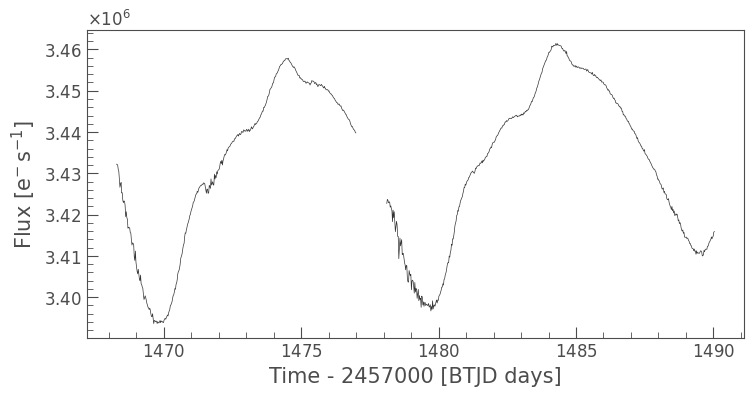

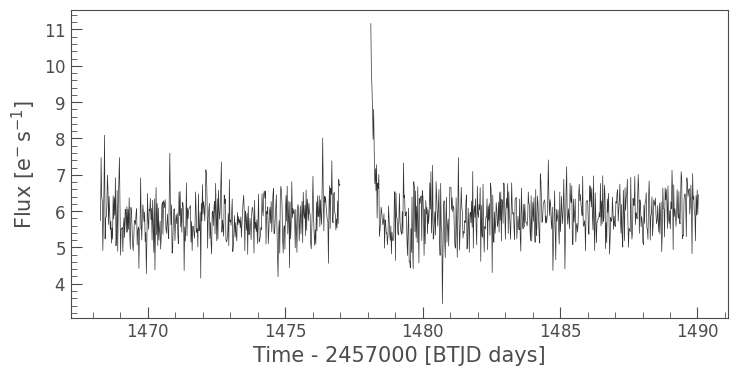

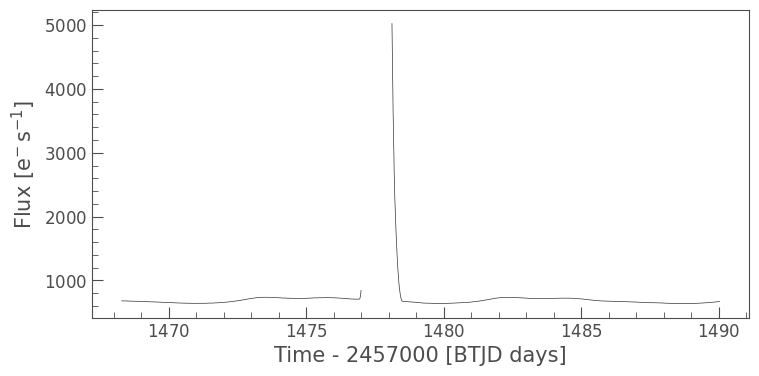

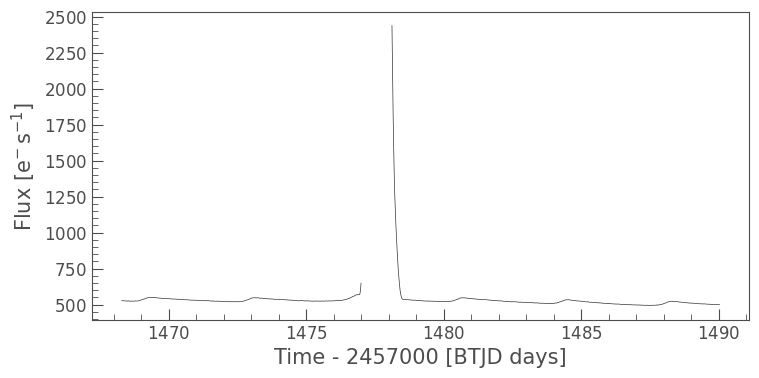

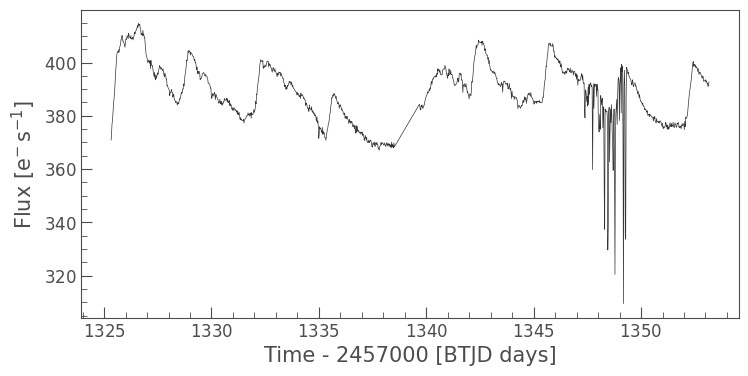

...

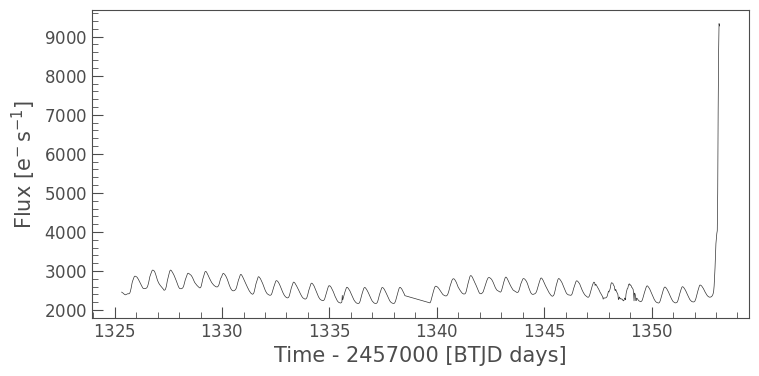

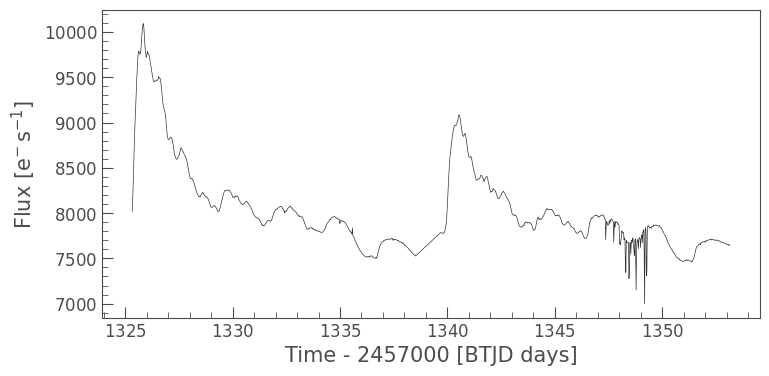

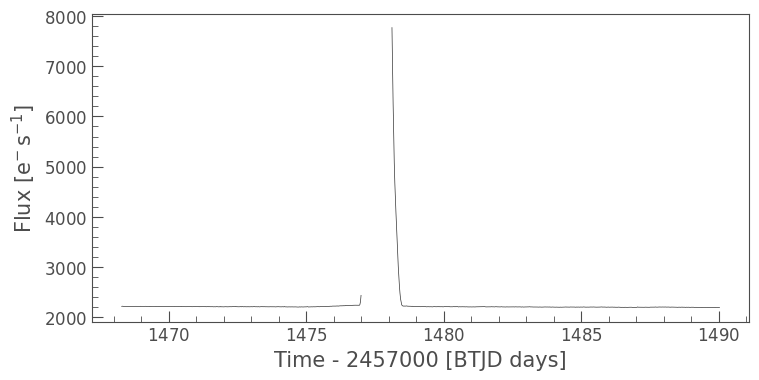

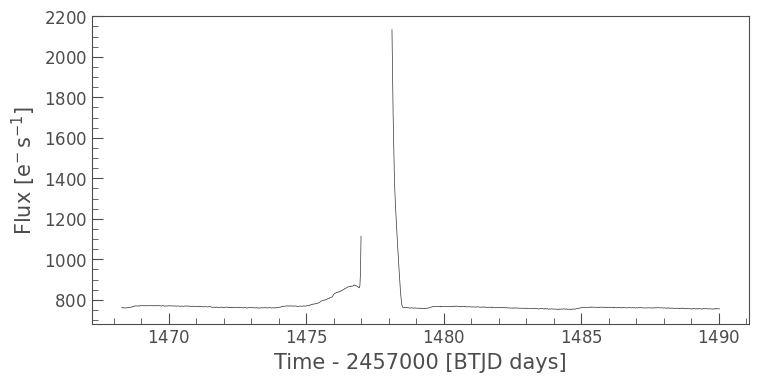

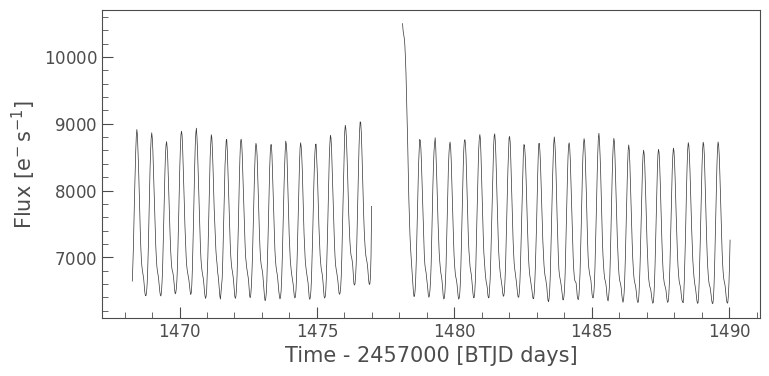

In [ ]:

# Loop through all paper Cepheids
for paper_cepheid in paper_cepheids:
    print(f"Processing TIC {paper_cepheid}...")

    # Search for the FFI cutout using TessCut
    cutout_search_result = search_tesscut(f"TIC {paper_cepheid}")

    # Check if any FFI cutouts are found
    if len(cutout_search_result) > 0:
        # Download the cutout
        cutout = cutout_search_result.download(cutout_size=10)  # Adjust cutout size as needed

        # Check if the pipeline mask is available
        if cutout.pipeline_mask is not None and cutout.pipeline_mask.any():
            # Generate a light curve using the pipeline mask
            lightcurve = cutout.to_lightcurve(aperture_mask="pipeline")
        else:
            print("Pipeline mask is missing or empty. Using a threshold mask instead.")
            # Generate a light curve using the threshold mask
            lightcurve = cutout.to_lightcurve(aperture_mask="threshold")

        # Plot the light curve
        lightcurve.plot(title=f"Light Curve of TIC {paper_cepheid} from FFI Cutout")
    else:
        print(f"No FFI cutouts found for TIC {paper_cepheid}")

c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 7 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Best Period: 5.353300675101903 d


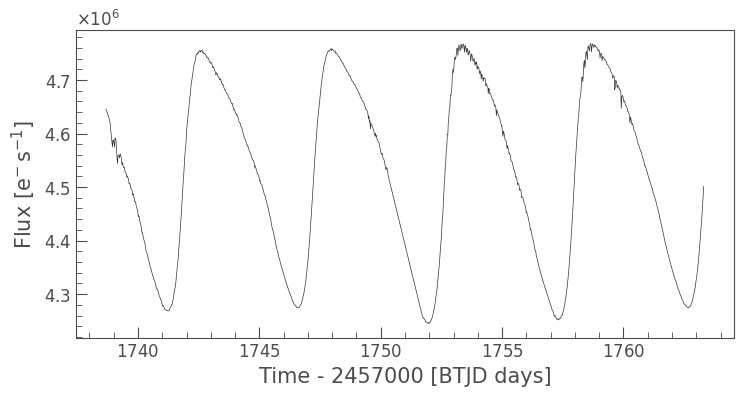

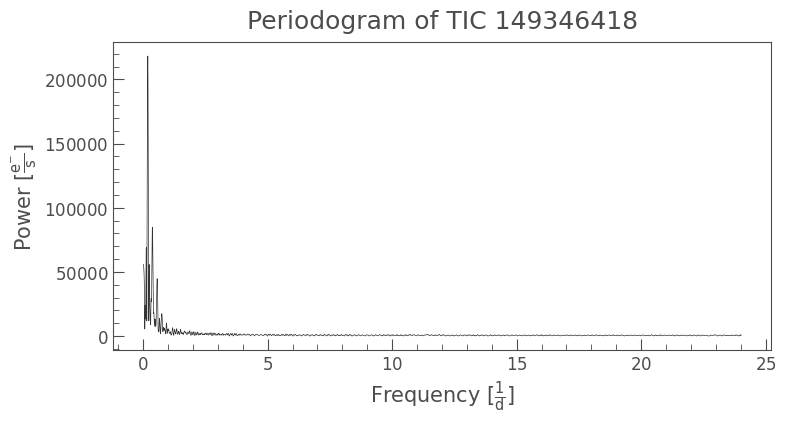

In [53]:
# Search for the FFI cutout using TessCut
cutout_search_result = search_tesscut(f"Delta Cephei")

# Check if any FFI cutouts are found
if len(cutout_search_result) > 0:
    # Download the cutout
    cutout = cutout_search_result.download(cutout_size=10)  # Adjust cutout size as needed

    # Check if the pipeline mask is available
    if cutout.pipeline_mask is not None and cutout.pipeline_mask.any():
        # Generate a light curve using the pipeline mask
        lightcurve = cutout.to_lightcurve(aperture_mask="pipeline")
    else:
        print("Pipeline mask is missing or empty. Using a threshold mask instead.")
        # Generate a light curve using the threshold mask
        lightcurve = cutout.to_lightcurve(aperture_mask="threshold")

    # Plot the light curve
    lightcurve.plot(title=f"Light Curve of TIC {paper_cepheids[0]} from FFI Cutout")

    # Generate and plot the periodogram
    periodogram = lightcurve.to_periodogram()
    periodogram.plot(title=f"Periodogram of TIC {paper_cepheids[0]}")

    # Extract the period corresponding to the maximum power
    best_period = periodogram.period_at_max_power
    print(f"Best Period: {best_period}")
else:
    print(f"No FFI cutouts found for TIC {paper_cepheids[0]}")

In [ ]:
# TODO: write code to get period jitter
# can look into Delta Cephei as well for an example of well studied cepheids

# Looking into SMC/LMC

In [ ]:
# motivation: callibrating the P-L relation using LMC/SMC (known distances)
# get smc/lmc cepheids, start with 5 brightest ones in each and plot curves

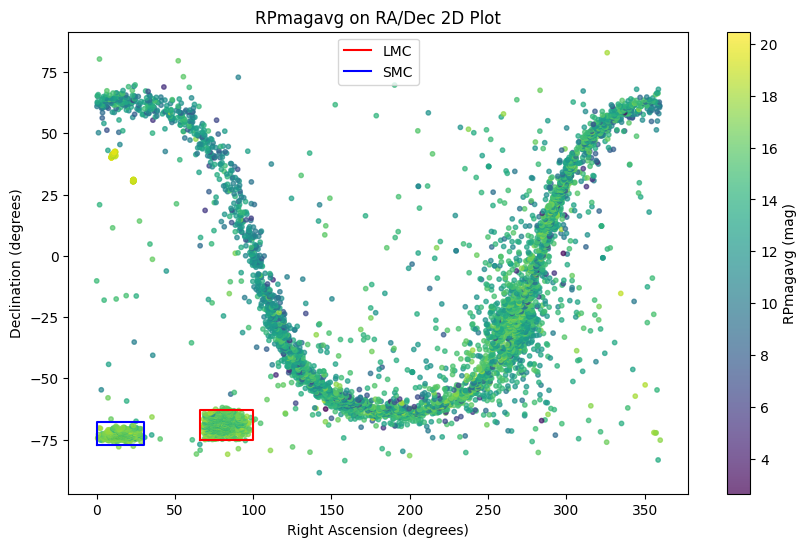

In [63]:
# Define the coordinates for the LMC and SMC
lmc_ra_range = [66, 100]  # Approximate RA range for the LMC
lmc_dec_range = [-75, -63]  # Approximate Dec range for the LMC

smc_ra_range = [0, 30]  # Approximate RA range for the SMC
smc_dec_range = [-77, -68]  # Approximate Dec range for the SMC

# Create the scatter plot of RA and Dec
plt.figure(figsize=(10, 6))
scatter = plt.scatter(ra_values, dec_values, c=rp_mag, cmap='viridis', s=10, alpha=0.7)
plt.colorbar(scatter, label='RPmagavg (mag)')
plt.xlabel('Right Ascension (degrees)')
plt.ylabel('Declination (degrees)')
plt.title('RPmagavg on RA/Dec 2D Plot')

# Draw a box around the LMC
plt.plot([lmc_ra_range[0], lmc_ra_range[1], lmc_ra_range[1], lmc_ra_range[0], lmc_ra_range[0]],
         [lmc_dec_range[0], lmc_dec_range[0], lmc_dec_range[1], lmc_dec_range[1], lmc_dec_range[0]],
         color='red', label='LMC')

# Draw a box around the SMC
plt.plot([smc_ra_range[0], smc_ra_range[1], smc_ra_range[1], smc_ra_range[0], smc_ra_range[0]],
         [smc_dec_range[0], smc_dec_range[0], smc_dec_range[1], smc_dec_range[1], smc_dec_range[0]],
         color='blue', label='SMC')

# Add a legend
plt.legend()

# Show the plot
plt.show()

Harm        Source             SolID        ...     RA_ICRS         DE_ICRS    
                                            ...       deg             deg      
---- ------------------- ------------------ ... --------------- ---------------
Harm 4662155148333196800 375316653866487564 ...  73.91899123323 -66.42869965718
Harm 4658325789850642048 375316653866487564 ...  79.87712568566 -68.68603245893
Harm 4659422866270932352 375316653866487564 ...  86.21075216570 -67.49458515571
Harm 4661326189635227648 375316653866487564 ...  75.03154142881 -68.45001805764
Harm 4661266399338865408 375316653866487564 ...  76.81663647570 -68.88348483914
Harm 4664612492399408128 375316653866487564 ...  74.11164954424 -64.69451687849
Harm 4658656609733883648 375316653866487564 ...  81.28446938683 -67.64415381064
Harm 4660251348288638848 375316653866487564 ...  84.00478008947 -66.84492640929
Harm 4658929254268139904 375316653866487564 ...  78.47364693063 -67.06345649420
Harm 4651842008477556992 375316653866487

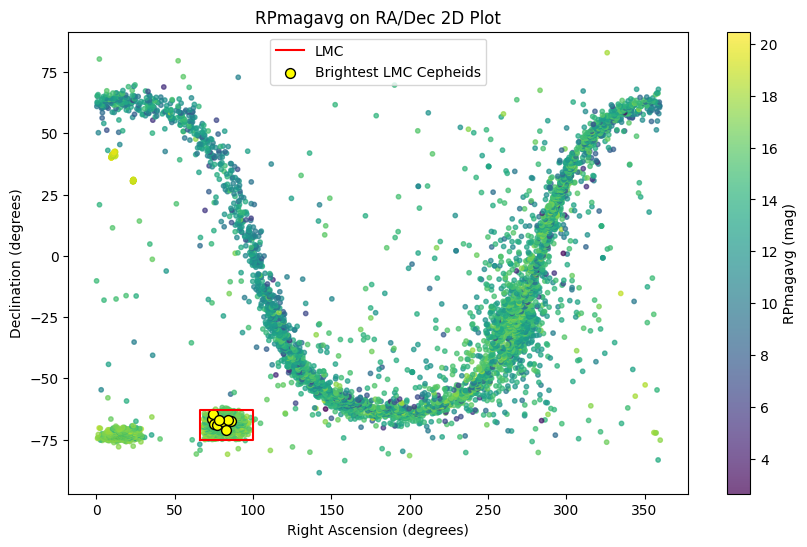

In [ ]:
# Filter Cepheids in the LMC region
lmc_cepheids = cepheids[0][
    (cepheids[0]['RA_ICRS'] >= lmc_ra_range[0]) &
    (cepheids[0]['RA_ICRS'] <= lmc_ra_range[1]) &
    (cepheids[0]['DE_ICRS'] >= lmc_dec_range[0]) &
    (cepheids[0]['DE_ICRS'] <= lmc_dec_range[1])
]

# Sort by brightness (e.g., RPmagavg)
lmc_cepheids_sorted = lmc_cepheids[np.argsort(lmc_cepheids['RPmagavg'])]

# Select the 5 brightest Cepheids
brightest_lmc_cepheids = lmc_cepheids_sorted[:10]

# Display the results
print(brightest_lmc_cepheids)





# Plot the 5 brightest LMC Cepheids on the existing plot
plt.figure(figsize=(10, 6))
scatter = plt.scatter(ra_values, dec_values, c=rp_mag, cmap='viridis', s=10, alpha=0.7)
plt.colorbar(scatter, label='RPmagavg (mag)')
plt.xlabel('Right Ascension (degrees)')
plt.ylabel('Declination (degrees)')
plt.title('RPmagavg on RA/Dec 2D Plot')

# Draw a box around the LMC
plt.plot([lmc_ra_range[0], lmc_ra_range[1], lmc_ra_range[1], lmc_ra_range[0], lmc_ra_range[0]],
         [lmc_dec_range[0], lmc_dec_range[0], lmc_dec_range[1], lmc_dec_range[1], lmc_dec_range[0]],
         color='red', label='LMC')

# Highlight the 5 brightest LMC Cepheids
plt.scatter(brightest_lmc_cepheids['RA_ICRS'], brightest_lmc_cepheids['DE_ICRS'],
            color='yellow', edgecolor='black', s=50, label='Brightest LMC Cepheids')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [76]:
# Initialize a dictionary to store the mapping of LMC Cepheids to TESS Cepheids
lmc_to_tess_mapping = {}

# Loop through the brightest LMC Cepheids
for i in range(len(brightest_lmc_cepheids)):
    # Extract RA_ICRS and DEC_ICRS of the current star
    ra_icrs = brightest_lmc_cepheids['RA_ICRS'][i]
    dec_icrs = brightest_lmc_cepheids['DE_ICRS'][i]
    lmc_cepheid = brightest_lmc_cepheids['Source'][i]  # Assuming 'Source' is the unique ID for LMC Cepheids

    # Perform a crossmatch using the tic_crossmatch function
    crossmatch_result = tic_crossmatch(ra_icrs, dec_icrs)

    # Check if there are matches
    if "data" in crossmatch_result and len(crossmatch_result["data"]) > 0:
        # Extract all matched TIC IDs
        tess_ids = [match["MatchID"] for match in crossmatch_result["data"]]
        # Store unique TESS IDs as a list
        lmc_to_tess_mapping[lmc_cepheid] = list(set(tess_ids))

# Display the mapping
print(f"LMC to TESS Cepheid Mapping: {lmc_to_tess_mapping}")


LMC to TESS Cepheid Mapping: {np.int64(4662155148333196800): [683671552, 683671553, 683671554, 683671555, 683671556, 683671557, 683671558, 683671559, 683671560, 683671561, 683671562, 683671563, 683671564, 683671565, 683671566, 683671567, 683671568, 683671569, 683671570, 683671571, 683671572, 683671573, 683671574, 683671575, 683671576, 683671577, 683671578, 683671579, 683671580, 683671581, 683671582, 683671583, 683671584, 683671585, 683671586, 683671587, 683671588, 683671589, 683671590, 683671591, 683671592, 683671593, 683671594, 683671595, 683671596, 683671597, 683671598, 683671599, 683671600, 683671601, 683671602, 683671603, 683671604, 683671605, 683671606, 683671607, 683671608, 683671609, 683671610, 683671611, 683671612, 683671613, 683671614, 683671615, 683671616, 683671617, 683671618, 683671619, 683671620, 683671621, 683671622, 683671623, 683671624, 683671625, 683671626, 683671627, 683671628, 683671629, 683671630, 683671631, 683671632, 683671633, 683671634, 683671635, 683671636, 683

In [90]:
import csv

# Define the output CSV file name
output_file = "lmc_to_tess_mapping.csv"

# Write the dictionary to the CSV file
with open(output_file, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerow(["LMC_Cepheid", "TESS_IDs"])  # Write the header
    for lmc_cepheid, tess_ids in lmc_to_tess_mapping.items():
        writer.writerow([lmc_cepheid, ";".join(map(str, tess_ids))])  # Join TESS IDs with a semicolon

print(f"LMC to TESS mapping saved to {output_file}")

LMC to TESS mapping saved to lmc_to_tess_mapping.csv


Processing LMC Cepheid 4662155148333196800 with TESS ID 683671552...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 39 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing LMC Cepheid 4658325789850642048 with TESS ID 680787968...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 39 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing LMC Cepheid 4659422866270932352 with TESS ID 731512963...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 31 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing LMC Cepheid 4661326189635227648 with TESS ID 682525283...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 38 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing LMC Cepheid 4661266399338865408 with TESS ID 681574400...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 38 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing LMC Cepheid 4664612492399408128 with TESS ID 684739494...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 38 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing LMC Cepheid 4658656609733883648 with TESS ID 373914207...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 38 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.
Processing LMC Cepheid 4660251348288638848 with TESS ID 732567679...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 36 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.


Processing LMC Cepheid 4658929254268139904 with TESS ID 40973372...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 36 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.


Processing LMC Cepheid 4651842008477556992 with TESS ID 725745664...


c:\Python313\Lib\site-packages\lightkurve\search.py:424: LightkurveWarning: Warning: 39 files available to download. Only the first file has been downloaded. Please use `download_all()` or specify additional criteria (e.g. quarter, campaign, or sector) to limit your search.
  warnings.warn(


Pipeline mask is missing or empty. Using a threshold mask instead.


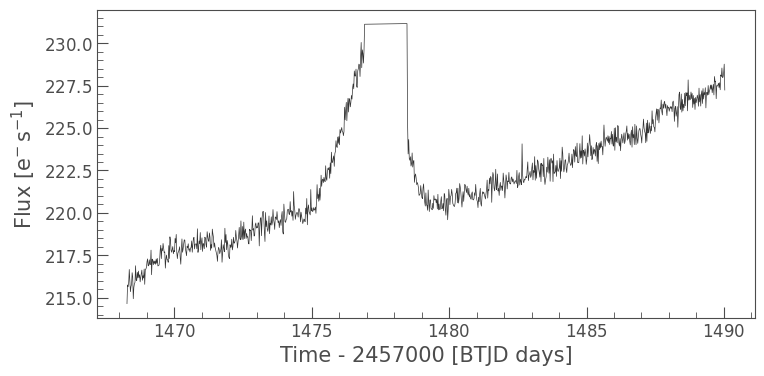

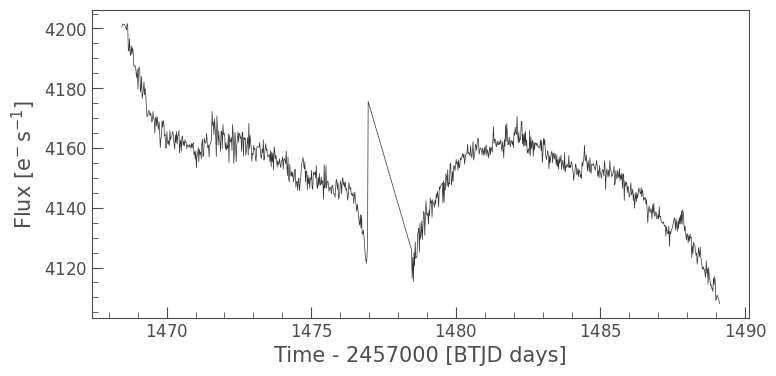

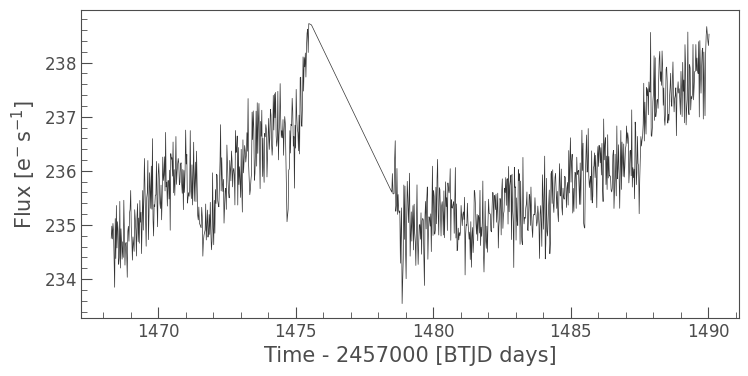

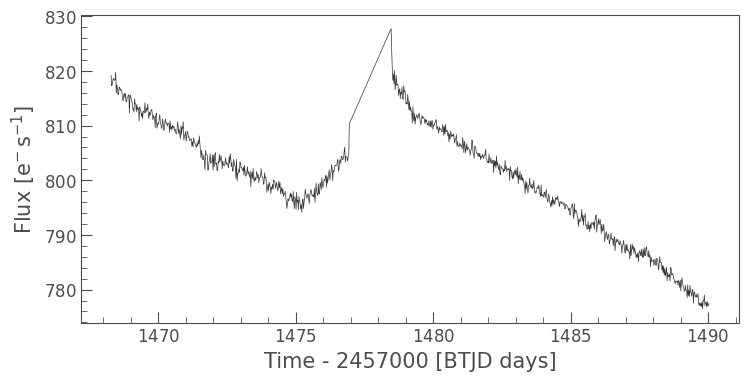

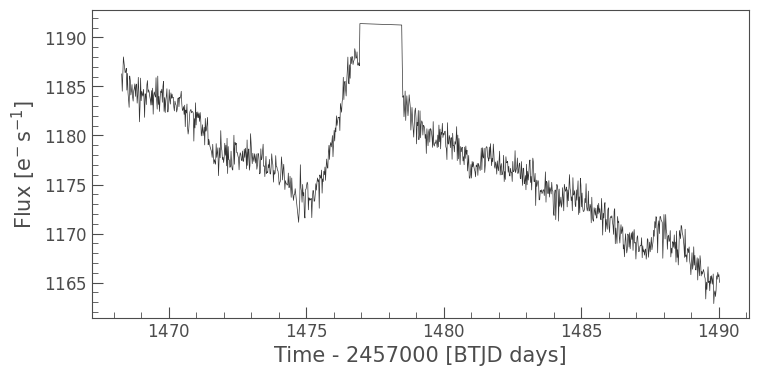

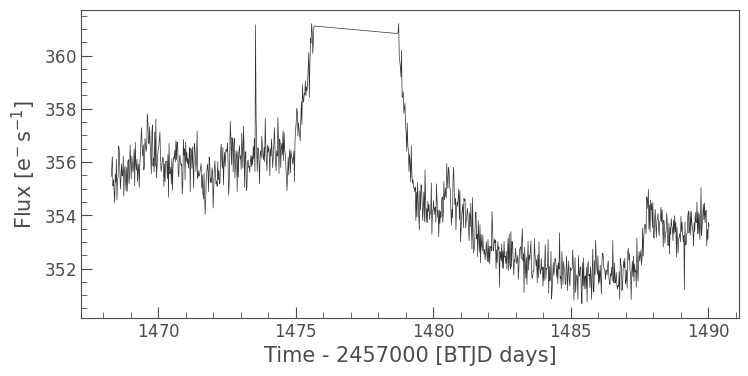

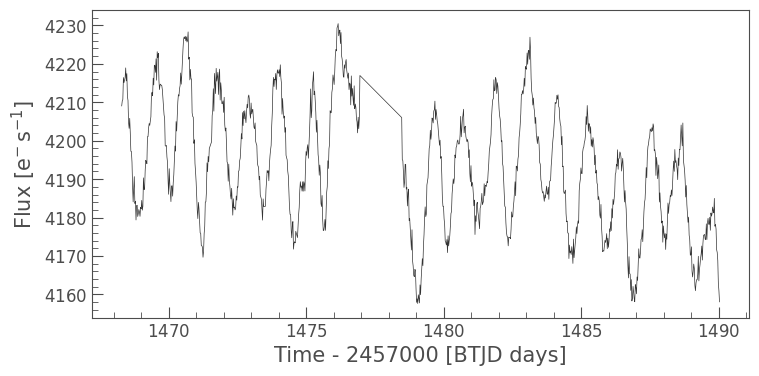

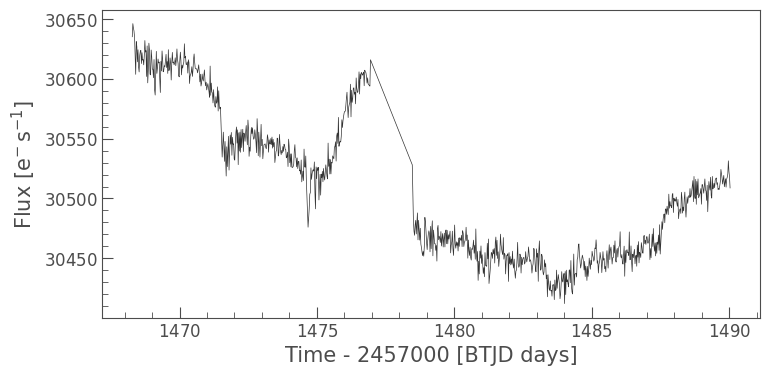

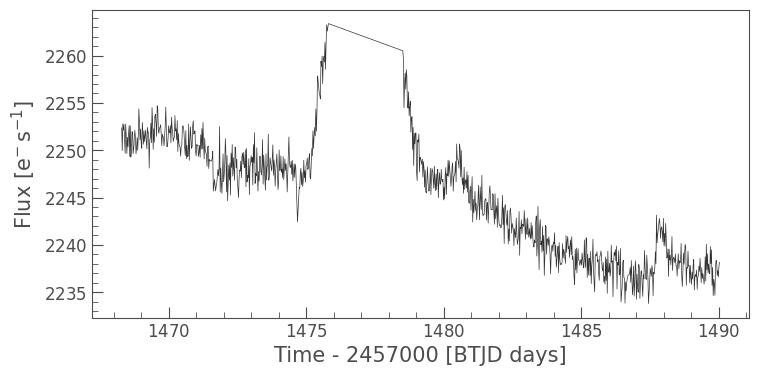

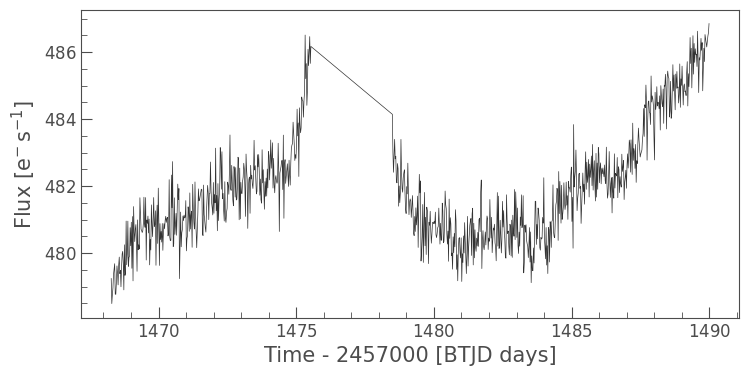

In [92]:
from astropy.stats import sigma_clip

for lmc_cepheid, tess_ids in lmc_to_tess_mapping.items():
    if tess_ids:  # Ensure there are TESS IDs available
        first_tess_id = tess_ids[0]
        print(f"Processing LMC Cepheid {lmc_cepheid} with TESS ID {first_tess_id}...")

        # Search for the FFI cutout using TessCut
        cutout_search_result = lk.search_tesscut(f"TIC {first_tess_id}")

        # Check if any FFI cutouts are found
        if len(cutout_search_result) > 0:
            # Download the cutout
            cutout = cutout_search_result.download(cutout_size=10)  # Adjust cutout size as needed

            # Check if the pipeline mask is available
            if cutout.pipeline_mask is not None and cutout.pipeline_mask.any():
                print("Pipeline mask is available. Using it.")
                lightcurve = cutout.to_lightcurve(aperture_mask="pipeline")
            else:
                print("Pipeline mask is missing or empty. Using a threshold mask instead.")
                lightcurve = cutout.to_lightcurve(aperture_mask="threshold")

            # Remove outliers using sigma clipping
            clipped_flux = sigma_clip(lightcurve.flux, sigma=3, maxiters=5)
            lightcurve = lightcurve[~clipped_flux.mask]

            # Plot the light curve
            lightcurve.plot(title=f"Light Curve of LMC Cepheid {lmc_cepheid} (TIC {first_tess_id})")
        else:
            print(f"No FFI cutouts found for TESS ID {first_tess_id}")
    else:
        print(f"No TESS IDs found for LMC Cepheid {lmc_cepheid}")